# IHS Pansharpening 

Les étape du *IHS pansharpening* sont :
1) augmenter la résolution de l'image RGB pour qu'elle corresponde à la résolution de l'image panchromatique,
2) passer cette image dans le repère HSV
3) remplacer le channel value (V) par l'image panchromatique
4) repasser en RGB

## Chargement des images

In [1]:
import matplotlib.pyplot as plt
import cv2

In [2]:
PATH = "../images/our-images/"

In [3]:
def plot(img):
    plt.figure(figsize = (13, 13))
    plt.imshow(img, cmap='gray')
    img.shape

In [4]:
def plot_list(imgs, titles = None):
    fig, ax = plt.subplots(1, len(imgs), figsize=(26, 13))

    fig.figsize = (13,13)
    for i, img in enumerate(imgs):
        ax[i].imshow(img, cmap='gray')

        if titles != None:
            ax[i].set_title(titles[i])

In [5]:
def read_rgb(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [6]:
def load_images(name, ext):
    path = PATH + name
    img = read_rgb(path + "-cropped." + ext)
    bw = cv2.imread(path + "-bw." + ext, cv2.IMREAD_GRAYSCALE)
    ds = read_rgb(path + "-ds." + ext)
    return (img, bw, ds)

img, bw, ds = load_images("star-fort", "jpg")

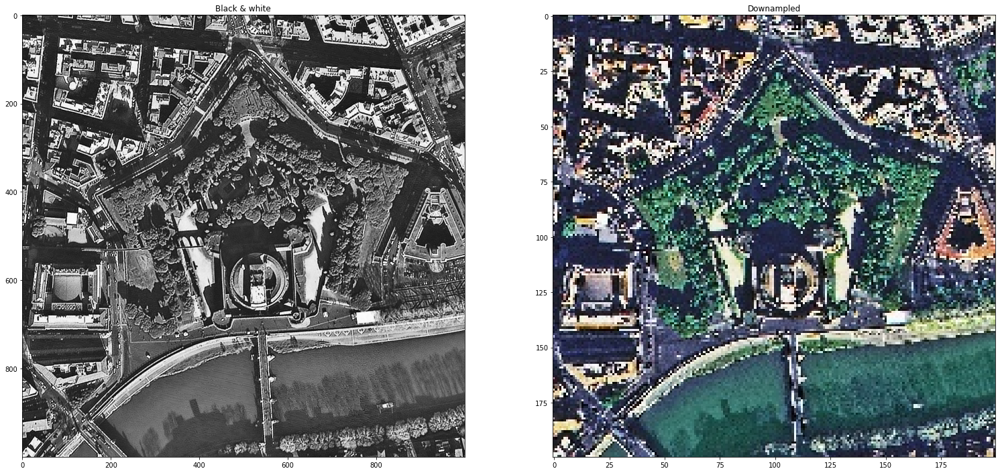

In [7]:
plot_list([bw, ds], ['Black & white', 'Downampled'])

## 1. Upsampling

On augmente la résolution de l'image couleur à celle de l'image en niveau de gris.

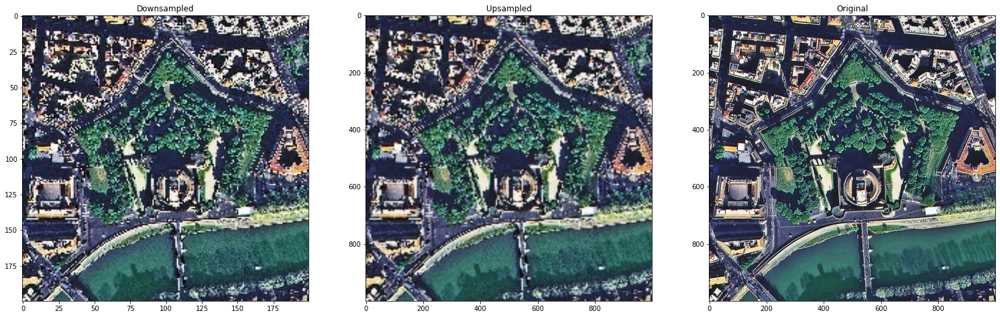

In [8]:
w, h = bw.shape[1], bw.shape[0]
us = cv2.resize(ds, (w, h))

plot_list([ds, us, img], ['Downsampled', 'Upsampled', 'Original'])

## 2. To HSV

In [9]:
hsv = cv2.cvtColor(us, cv2.COLOR_RGB2HSV)
v = hsv[:,:,2]

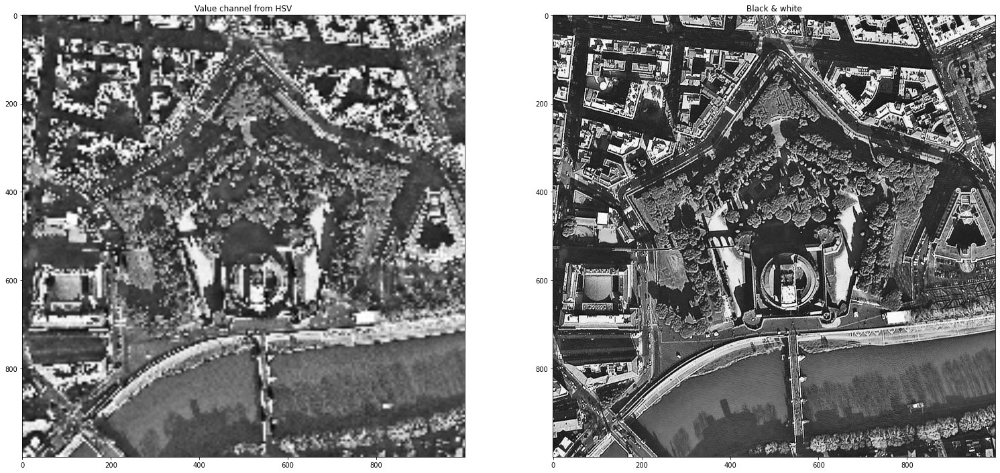

In [10]:
plot_list([v, bw], ['Value channel from HSV', 'Black & white'])

## 3. Remplacer V par l'image panchromatique

In [11]:
hsv[:,:,2] = bw

## 4. From HSV

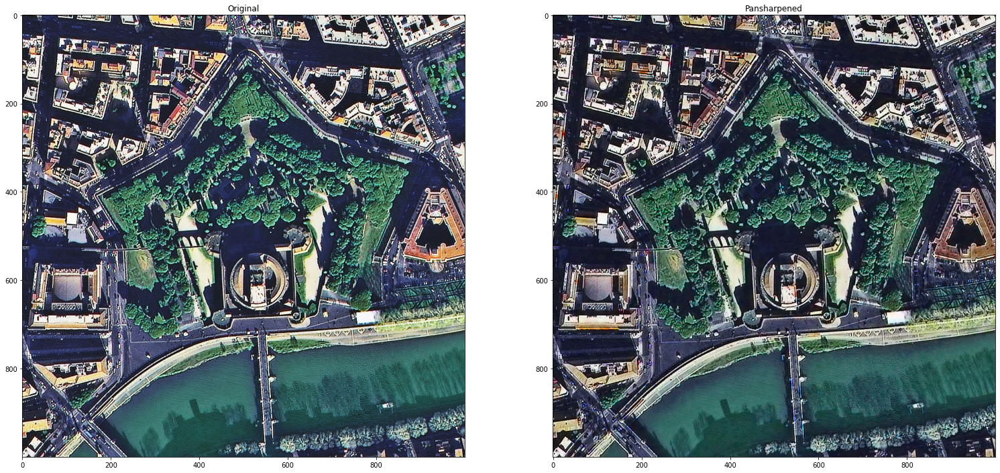

In [12]:
pansharpened = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
plot_list([img, pansharpened], ['Original', 'Pansharpened'])

## Difference

In [13]:
import numpy as np

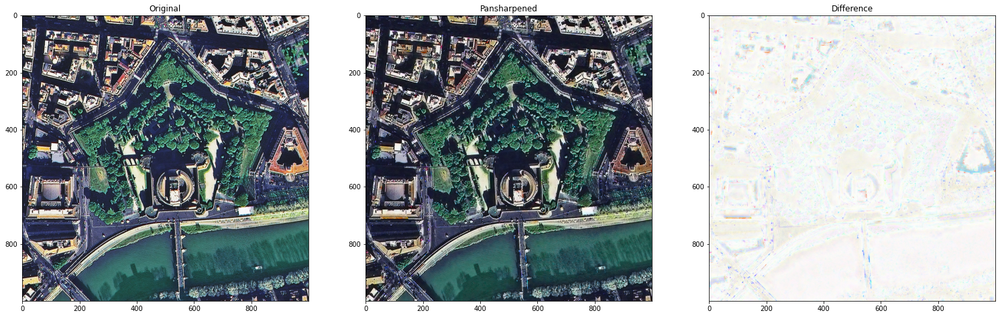

In [14]:
diff = 255 - np.abs(pansharpened.astype(int) - img.astype(int))
plot_list([img, pansharpened, diff], ['Original', 'Pansharpened', 'Difference'])

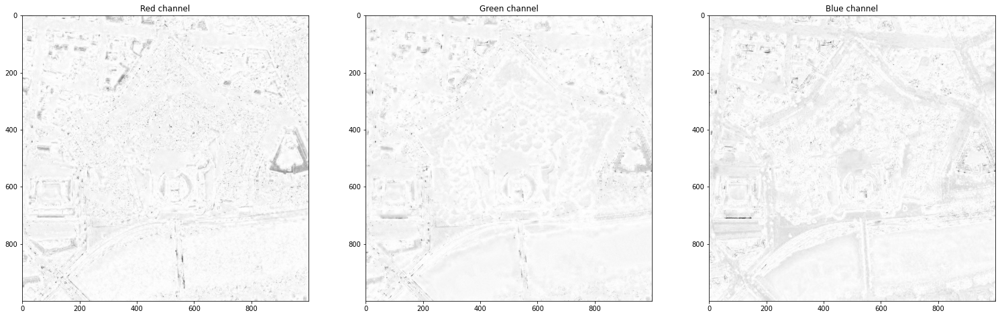

In [15]:
plot_list([diff[:,:,0], diff[:,:,1], diff[:,:,2]], ['Red channel', 'Green channel', 'Blue channel'])